In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
from datetime import datetime, timedelta
from tqdm import tqdm
import random
from scipy import stats
from scipy.stats import chi2_contingency, ttest_ind

warnings.filterwarnings('ignore')

# for visualization styling
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("viridis")
PLOTLY_TEMPLATE = "plotly_dark"

print("Libraries imported successfully.")

Libraries imported successfully.


In [10]:
def _calculate_engagement_factors(customer_info, current_day):
    """Calculates engagement and satisfaction based on the customer's churn status."""
    base_engagement = 1.0
    satisfaction = random.randint(7, 10)
    app_crashes = 0 if random.random() > 0.1 else 1

    # --- Convert all date inputs to pandas Timestamps for safety ---
    churn_date = pd.to_datetime(customer_info['churn_date'])
    current_day = pd.to_datetime(current_day)

    if customer_info['account_status'] == 'Churned' and customer_info['churn_type'] == 'Gradual':
        days_to_churn = (churn_date - current_day).days

        if 0 < days_to_churn <= 120:
            decline_factor = (days_to_churn / 120.0) ** 0.5
            base_engagement *= decline_factor
            satisfaction = max(1, int(10 * decline_factor) - random.randint(1, 4))
            if random.random() > decline_factor:
                app_crashes += random.randint(1, 3)

    return base_engagement, satisfaction, app_crashes

def generate_aggregated_behavior_df(customers_df: pd.DataFrame, current_date: datetime.date) -> pd.DataFrame:
    """
    Generates behavior data and aggregates it on-the-fly to produce a
    customer-level summary DataFrame, avoiding high memory usage.
    This version correctly handles mixed date/timestamp types.
    """
    print("Generating and aggregating behavior data in-memory...")

    aggregated_records = []

    # --- Standardize all date types at the beginning ---
    current_date = pd.to_datetime(current_date)
    customers_df['registration_date'] = pd.to_datetime(customers_df['registration_date'])
    customers_df['churn_date'] = pd.to_datetime(customers_df['churn_date']) # Handles NaT (Not a Time) correctly

    for _, cust_info in tqdm(customers_df.iterrows(), total=customers_df.shape[0], desc="Processing Customers"):
        daily_records = []

        # Now all comparisons and subtractions are between Timestamps
        start_date = max(current_date - timedelta(days=BEHAVIOR_HISTORY_DAYS), cust_info['registration_date'])
        end_date = cust_info['churn_date'] if cust_info['account_status'] == 'Churned' and pd.notna(cust_info['churn_date']) else current_date

        for i in range((end_date - start_date).days + 1):
            current_day = start_date + timedelta(days=i)
            engagement, satisfaction, crashes = _calculate_engagement_factors(cust_info, current_day)

            record = {
                "date": current_day,
                "login_count": max(0, int(random.gauss(5, 2) * engagement)),
                "session_duration_minutes": max(0, int(random.gauss(20, 10) * engagement)),
                "support_tickets_created": 1 if (random.random() > 0.95 and engagement < 0.7) else 0,
                "app_crashes": crashes,
                "customer_satisfaction_score": max(1, min(10, satisfaction)),
            }
            daily_records.append(record)

        if not daily_records:
            continue

        temp_df = pd.DataFrame(daily_records)
        summary = {
            'customer_id': cust_info['customer_id'],
            'total_logins': temp_df['login_count'].sum(),
            'total_session_minutes': temp_df['session_duration_minutes'].sum(),
            'avg_session_minutes': temp_df['session_duration_minutes'].mean(),
            'total_support_tickets': temp_df['support_tickets_created'].sum(),
            'total_app_crashes': temp_df['app_crashes'].sum(),
            'avg_satisfaction_score': temp_df['customer_satisfaction_score'].mean(),
            'std_satisfaction_score': temp_df['customer_satisfaction_score'].std(),
            'days_since_last_seen': (current_date - temp_df['date'].max()).days
        }
        aggregated_records.append(summary)

    print("\nAggregation complete. Final DataFrame created.")
    return pd.DataFrame(aggregated_records)

In [8]:
# Get the data
df_customers = pd.read_csv('customer_demographics.csv')
df_transactions = pd.read_csv('transaction_data.csv')
# df_behaviour = pd.read_json('drive/MyDrive/dmml_assignment/customer_behavior.json')

# Merge into a single dataframe for easier analysis
# df = pd.merge(df_customers, df_behaviour, on='customer_id', how='left')

print("Synthetic data generated and loaded successfully.")
print(f"Customer data shape: {df_customers.shape}")
print(f"Transaction data shape: {df_transactions.shape}")
# print(f"Behavior data shape: {df_behaviour.shape}")
# print(f"Merged data shape: {df.shape}")

Synthetic data generated and loaded successfully.
Customer data shape: (50000, 15)
Transaction data shape: (1971565, 12)


In [11]:
CURRENT_DATE = datetime.now().date()

# 2. Generate the final, aggregated DataFrame
df_behavior_aggregated = generate_aggregated_behavior_df(df_customers, CURRENT_DATE)

# 3. Display the result. This DataFrame is small and ready for your notebook.
print(df_behavior_aggregated)

Generating and aggregating behavior data in-memory...


Processing Customers: 100%|██████████| 50000/50000 [53:56<00:00, 15.45it/s]



Aggregation complete. Final DataFrame created.
       customer_id  total_logins  total_session_minutes  avg_session_minutes  \
0      CUST_000001          1276                   5747            17.521341   
1      CUST_000002           364                   1613            19.670732   
2      CUST_000003          3325                  14274            19.526676   
3      CUST_000004          3215                  14352            19.633379   
4      CUST_000005          3328                  14340            19.616963   
...            ...           ...                    ...                  ...   
46634  CUST_049996          3275                  13904            19.020520   
46635  CUST_049997          3273                  14507            19.845417   
46636  CUST_049998          2936                  12340            19.311424   
46637  CUST_049999          3299                  14265            19.514364   
46638  CUST_050000          1728                   7561            19.28

In [14]:
df_customers = pd.merge(df_customers, df_behavior_aggregated, on='customer_id', how='left')

In [15]:
print("\n--- Section 1: Data Loading and Initial Exploration ---")

# Display basic information
print("\n**Customer Data Info:**")
df_customers.info()

print("\n**Transaction Data Info:**")
df_transactions.info()

# Show first few rows
print("\n**Customer Data Head:**")
print(df_customers.head())

print("\n**Transaction Data Head:**")
print(df_transactions.head())

# Basic statistics
print("\n**Customer Data Descriptive Statistics:**")
print(df_customers.describe())

print("\n**Transaction Data Descriptive Statistics:**")
print(df_transactions.describe())


--- Section 1: Data Loading and Initial Exploration ---

**Customer Data Info:**
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   customer_id             50000 non-null  object        
 1   registration_date       50000 non-null  datetime64[ns]
 2   age                     50000 non-null  int64         
 3   gender                  49000 non-null  object        
 4   location_city           50000 non-null  object        
 5   location_state          50000 non-null  object        
 6   income_bracket          50000 non-null  object        
 7   education_level         48500 non-null  object        
 8   subscription_plan       50000 non-null  object        
 9   customer_segment        50000 non-null  object        
 10  marketing_channel       50000 non-null  object        
 11  tenure_months           

In [20]:
# Cell 4: Data Quality Assessment
print("\n--- Section 2: Data Cleaning and Preprocessing ---")

# Check for missing values
print("\n**Missing Values in Customer Data:**")
print(df_customers.isnull().sum())

print("\n**Missing Values in Transaction Data:**")
print(df_transactions.isnull().sum())

# Handle missing churn_date (it's expected for active customers)
# No other critical missing values in this synthetic dataset

# Check for duplicates
print(f"\nDuplicate customer records found: {df_customers.duplicated().sum()}")
print(f"Duplicate transaction records found: {df_transactions.duplicated().sum()}")

# Data Type Conversion
df_customers['registration_date'] = pd.to_datetime(df_customers['registration_date'])
df_customers['churn_date'] = pd.to_datetime(df_customers['churn_date'])
df_transactions['transaction_date'] = pd.to_datetime(df_transactions['transaction_date'])

# Derived Features
# Transaction Frequency per customer
trans_freq = df_transactions.groupby('customer_id').size().reset_index(name='transaction_frequency')
df_customers = pd.merge(df_customers, trans_freq, on='customer_id', how='left')
df_customers['transaction_frequency'].fillna(0, inplace=True)

print("\nData quality checks and preprocessing complete.")


--- Section 2: Data Cleaning and Preprocessing ---

**Missing Values in Customer Data:**
customer_id                   0
registration_date             0
age                           0
gender                     1000
location_city                 0
location_state                0
income_bracket                0
education_level            1500
subscription_plan             0
customer_segment              0
marketing_channel             0
tenure_months                 0
account_status                0
churn_date                42500
churn_type                42500
total_logins               3361
total_session_minutes      3361
avg_session_minutes        3361
total_support_tickets      3361
total_app_crashes          3361
avg_satisfaction_score     3361
std_satisfaction_score     3374
days_since_last_seen       3361
dtype: int64

**Missing Values in Transaction Data:**
transaction_id        0
customer_id           0
transaction_date      0
transaction_amount    0
transaction_type      0



--- Section 3.1: Customer Demographics Analysis ---


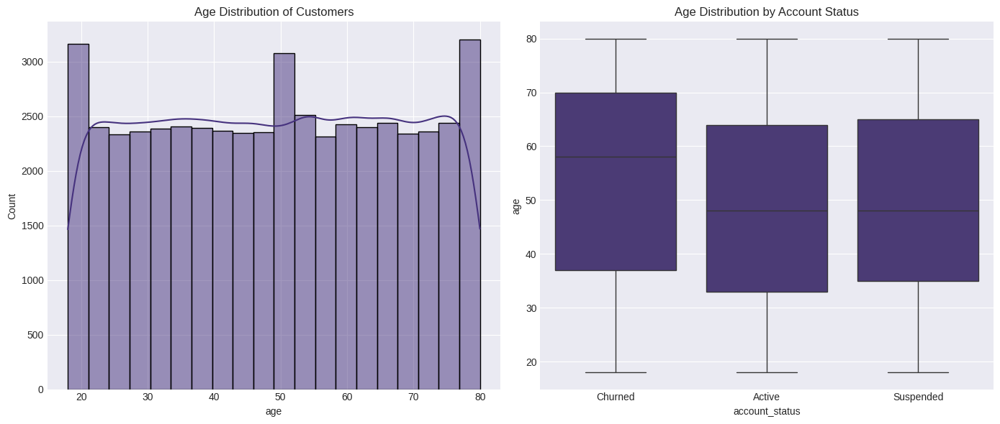

In [22]:
# Cell 5: Customer Demographics Analysis
print("\n--- Section 3.1: Customer Demographics Analysis ---")

# Age distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
sns.histplot(df_customers['age'], bins=20, kde=True, ax=axes[0])
axes[0].set_title('Age Distribution of Customers')
sns.boxplot(x='account_status', y='age', data=df_customers, ax=axes[1])
axes[1].set_title('Age Distribution by Account Status')
plt.tight_layout()
plt.show()

# Gender and Subscription Plan Distribution (Pie Charts)
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]],
                    subplot_titles=['Gender Distribution', 'Subscription Plan'])
fig.add_trace(go.Pie(labels=df_customers['gender'].value_counts().index,
                     values=df_customers['gender'].value_counts().values,
                     name="Gender"), 1, 1)
fig.add_trace(go.Pie(labels=df_customers['subscription_plan'].value_counts().index,
                     values=df_customers['subscription_plan'].value_counts().values,
                     name="Subscription"), 1, 2)
fig.update_layout(title_text='Customer Demographics', template=PLOTLY_TEMPLATE)
fig.show()

In [23]:
# Cell 6: Transaction Data Analysis
print("\n--- Section 3.2: Transaction Analysis ---")

# Transaction Amount Distribution
fig = px.histogram(df_transactions, x='transaction_amount', nbins=100,
                   title='Distribution of Transaction Amount',
                   labels={'transaction_amount': 'Transaction Amount'},
                   template=PLOTLY_TEMPLATE)
fig.show()

# Monthly Transaction Trends
df_transactions['month'] = df_transactions['transaction_date'].dt.to_period('M').astype(str)
monthly_trends = df_transactions.groupby('month')['transaction_id'].count().reset_index()
fig = px.line(monthly_trends, x='month', y='transaction_id',
              title='Monthly Transaction Volume',
              labels={'month': 'Month', 'transaction_id': 'Number of Transactions'},
              template=PLOTLY_TEMPLATE)
fig.show()


--- Section 3.2: Transaction Analysis ---



--- Section 3.3: Churn Analysis ---
Overall Churn Rate: 15.00%


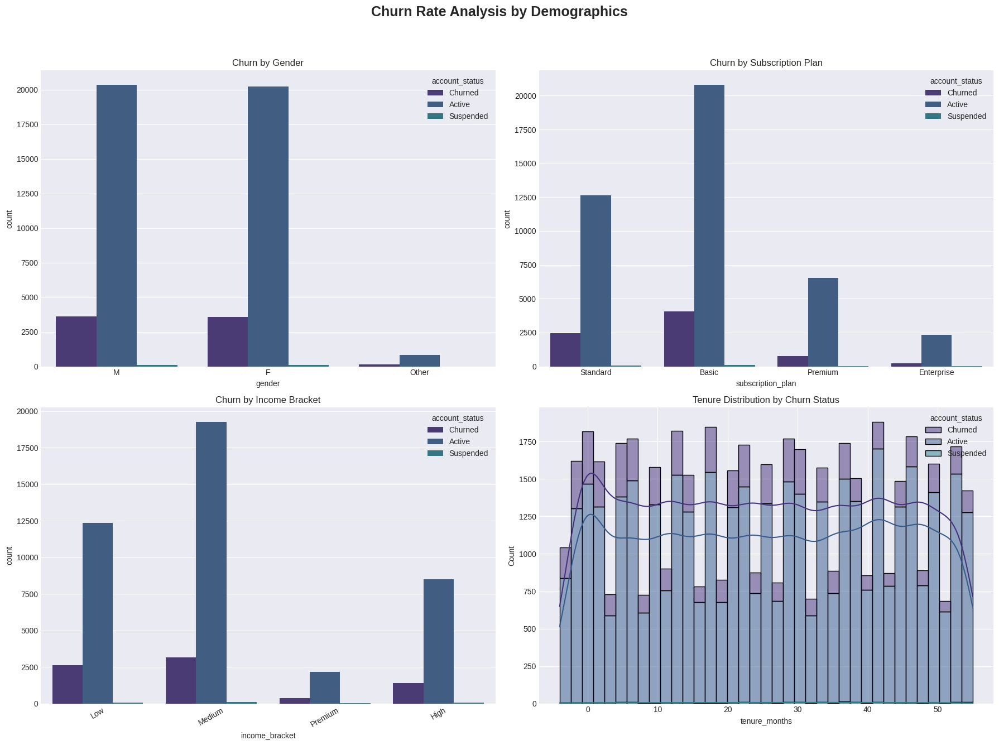

In [29]:
# Cell 7: Churn Analysis (Target Variable)
print("\n--- Section 3.3: Churn Analysis ---")

# Overall Churn Rate
churn_rate = (df_customers['account_status'] == 'Churned').mean()
print(f"Overall Churn Rate: {churn_rate:.2%}")

# Churn by Demographics
fig, axes = plt.subplots(2, 2, figsize=(18, 14))
fig.suptitle('Churn Rate Analysis by Demographics', fontsize=18, fontweight='bold')

# Churn by Gender
sns.countplot(data=df_customers, x='gender', hue='account_status', ax=axes[0, 0])
axes[0, 0].set_title('Churn by Gender')

# Churn by Subscription Plan
sns.countplot(data=df_customers, x='subscription_plan', hue='account_status', ax=axes[0, 1])
axes[0, 1].set_title('Churn by Subscription Plan')

# Churn by Income Bracket
sns.countplot(data=df_customers, x='income_bracket', hue='account_status', ax=axes[1, 0])
axes[1, 0].set_title('Churn by Income Bracket')
axes[1, 0].tick_params(axis='x', rotation=30)

# Tenure vs Churn
sns.histplot(data=df_customers, x='tenure_months', hue='account_status', multiple='stack', kde=True, ax=axes[1, 1])
axes[1, 1].set_title('Tenure Distribution by Churn Status')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


--- Section 3.4: Correlation and Relationship Analysis ---


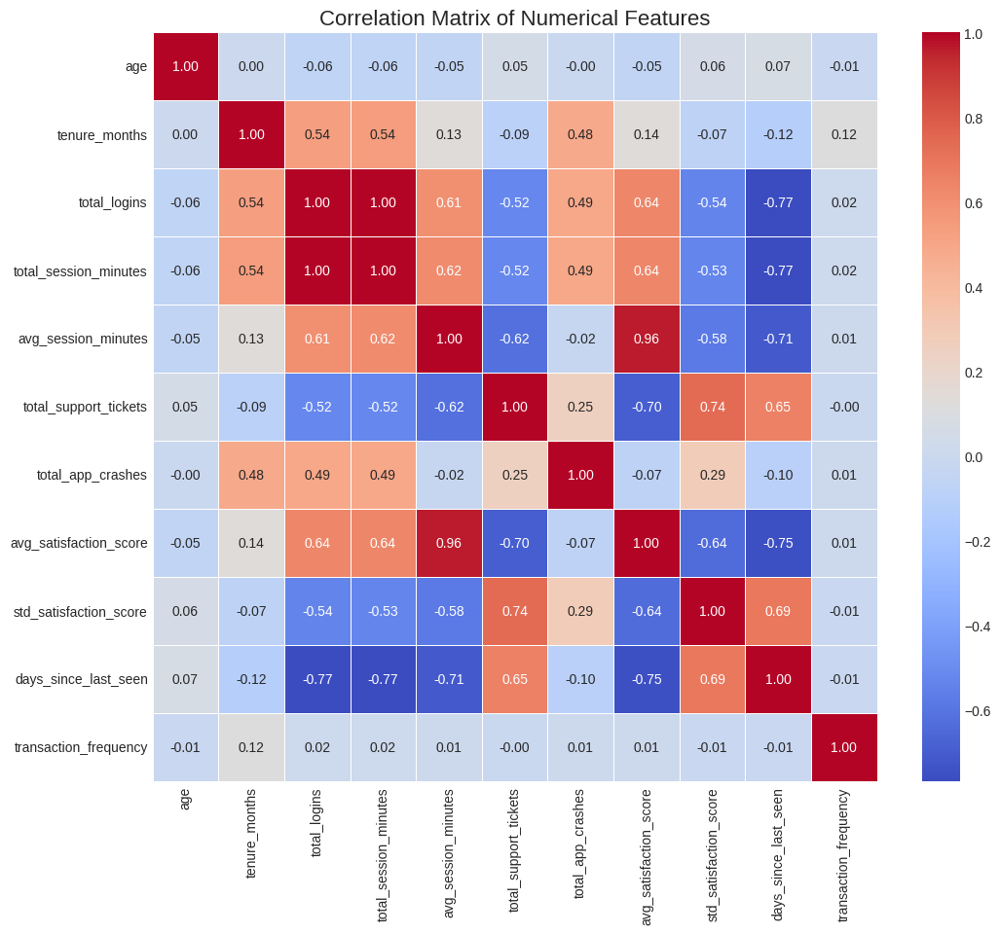

In [28]:
# Cell 8: Correlation and Relationship Analysis
print("\n--- Section 3.4: Correlation and Relationship Analysis ---")

# Correlation matrix for numerical variables
numerical_cols = df_customers.select_dtypes(include=np.number).columns
corr_matrix = df_customers[numerical_cols].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=.5)
plt.title('Correlation Matrix of Numerical Features', fontsize=16)
plt.show()

In [27]:
# Cell 9: Statistical Testing
print("\n--- Section 5: Statistical Analysis ---")

# T-test for Age and Churn
churned_age = df_customers[df_customers['account_status'] == 'Churned']['age']
active_age = df_customers[df_customers['account_status'] == 'Active']['age']
t_stat, p_val = ttest_ind(churned_age, active_age, nan_policy='omit')
print(f"T-test for Age vs. Churn: T-statistic={t_stat:.2f}, P-value={p_val:.4f}")
if p_val < 0.05:
    print(" -> The difference in age between churned and active customers is statistically significant.")
else:
    print(" -> No significant difference in age found.")

# Chi-square test for Gender and Churn
contingency_table = pd.crosstab(df_customers['gender'], df_customers['account_status'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(f"\nChi-square test for Gender vs. Churn: Chi2 statistic={chi2:.2f}, P-value={p:.4f}")
if p < 0.05:
    print(" -> The relationship between gender and churn is statistically significant.")
else:
    print(" -> No significant relationship found between gender and churn.")


--- Section 5: Statistical Analysis ---
T-test for Age vs. Churn: T-statistic=23.18, P-value=0.0000
 -> The difference in age between churned and active customers is statistically significant.

Chi-square test for Gender vs. Churn: Chi2 statistic=3.41, P-value=0.4923
 -> No significant relationship found between gender and churn.
